In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import os
import umap
import sklearn
from collections import defaultdict
import scanpy
import anndata as ad
import deicode
import matplotlib as mpl
from rdkit import Chem
from rdkit.Chem import Draw
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import networkx as nx
from sklearn import cross_decomposition
import pingouin as pg
from statsmodels.stats.multitest import multipletests
from matplotlib.backends.backend_pdf import PdfPages

/home/prajitrr/miniconda3/envs/rise-metabolomics-old/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
metabolomics_patient_metadata_sheet = pd.read_csv("../data/mzmine_data_from_jasmine/Plusrise_Metadata_abstract.csv", sep=",")
metabolomics_patient_metadata_sheet = metabolomics_patient_metadata_sheet[["ATTRIBUTE_participantid", "ATTRIBUTE_Metabolomics_ID"]]
patient_sample_dict = dict(zip(metabolomics_patient_metadata_sheet["ATTRIBUTE_participantid"].to_list(),
                               metabolomics_patient_metadata_sheet["ATTRIBUTE_Metabolomics_ID"].to_list()))
all_metabolomic_data = pd.read_csv("../data/mzmine_rerun/rise_plus_filtered_quant_table_rerun.csv", sep=",", index_col=0)
all_metabolomic_data_samples = all_metabolomic_data.iloc[:, 13:]
all_metabolomic_data_identifiers = all_metabolomic_data.iloc[:, 0:13]
all_metabolomic_data_samples.drop(columns=["Unnamed: 774"], inplace=True)
groups = np.array([item.split("_")[0] for item in all_metabolomic_data_samples.columns.to_list()])
all_metabolomic_data_samples = all_metabolomic_data_samples.rename(columns=lambda x : x.split(".")[0].split("_")[2])

patient_data = pd.read_csv("../output_data/matched_patients_without_replacement.csv", sep=",", index_col=0)
vip_score_data = pd.read_csv("../output_data/vip_dataframe_cancer_annotated.csv", sep=",", index_col=0)

In [3]:
cancer_patients = patient_data[(patient_data["cancer"] == True)]
cancer_patients = cancer_patients[cancer_patients["absolute_propensity_difference"] < 0.01]
controls = patient_data.loc[cancer_patients["nearest_patient"]].index.to_list()
cancer_and_control_patients = cancer_patients.index.to_list() + controls

cancer_and_control_patients_sample_ids= [str(patient_sample_dict[patient]) for patient in cancer_and_control_patients]

cancer_patients_nearest_patient_dict = dict(zip(cancer_patients.index.to_list(), cancer_patients["nearest_patient"].to_list()))

cancer_control_groups = groups[all_metabolomic_data_samples.columns.isin(cancer_and_control_patients_sample_ids)]
cancer_metabolomic_data_samples = all_metabolomic_data_samples.loc[:, all_metabolomic_data_samples.columns.isin(cancer_and_control_patients_sample_ids)]
patient_sample_dict_inverse = {v: k for k, v in patient_sample_dict.items()}
cancer_metabolomic_data_samples = cancer_metabolomic_data_samples.rename(columns=lambda x : patient_sample_dict_inverse[int(x)])

cancer_metabolomic_data_samples["sum"] = cancer_metabolomic_data_samples.sum(axis=1)
cancer_metabolomic_data_samples = cancer_metabolomic_data_samples[cancer_metabolomic_data_samples["sum"] > 0]
cancer_metabolomic_data_samples.drop(columns=["sum"], inplace=True)

# Drop rows with variance < 0.1
cancer_metabolomic_data_samples = cancer_metabolomic_data_samples.loc[cancer_metabolomic_data_samples.var(axis=1) > 0.1]

# Drop rows with zeros in over 75% of the samples
cancer_metabolomic_data_samples = cancer_metabolomic_data_samples.loc[(cancer_metabolomic_data_samples == 0).sum(axis=1) < 0.75 * cancer_metabolomic_data_samples.shape[1]]

# Impute zeros with a small value
cancer_metabolomic_data_samples_imputed = cancer_metabolomic_data_samples.replace(0, 1e-9)

# Separate cancer and control samples
metabolomic_data_samples_with_cancer_imputed = cancer_metabolomic_data_samples_imputed.loc[:, cancer_metabolomic_data_samples_imputed.columns.isin(cancer_patients.index.to_list())]
metabolomic_data_samples_with_cancer_imputed = metabolomic_data_samples_with_cancer_imputed[cancer_patients.index.to_list()]
metabolomic_data_samples_with_control_imputed = cancer_metabolomic_data_samples_imputed.loc[:, cancer_metabolomic_data_samples_imputed.columns.isin(controls)]
metabolomic_data_samples_with_control_imputed = metabolomic_data_samples_with_control_imputed[controls]

fold_change_paired = np.log2((metabolomic_data_samples_with_cancer_imputed.values / metabolomic_data_samples_with_control_imputed.values).mean(axis=1))
fold_change_unpaired = np.log2(np.mean(metabolomic_data_samples_with_cancer_imputed.values, axis=1) / np.mean(metabolomic_data_samples_with_control_imputed.values, axis=1))


# RCLR Transform

cancer_metabolomic_data_samples_rclr = cancer_metabolomic_data_samples.div(cancer_metabolomic_data_samples.sum(axis=0), axis=1)
geometric_means = np.exp(np.mean(np.log10(cancer_metabolomic_data_samples_rclr.replace(0, np.nan)), axis=0))
cancer_metabolomic_data_samples_rclr = cancer_metabolomic_data_samples_rclr.div(geometric_means, axis=1)
minimum_values = cancer_metabolomic_data_samples_rclr.replace(0, np.nan).min(axis=0)
cancer_metabolomic_data_samples_rclr = cancer_metabolomic_data_samples_rclr.replace(0, np.nan)
cancer_metabolomic_data_samples_rclr = cancer_metabolomic_data_samples_rclr.fillna(minimum_values)
cancer_metabolomic_data_samples_rclr = np.log10(cancer_metabolomic_data_samples_rclr)


# Separate cancer and control samples
metabolomic_data_samples_with_cancer_rclr = cancer_metabolomic_data_samples_rclr.loc[:, cancer_metabolomic_data_samples_rclr.columns.isin(cancer_patients.index.to_list())]
metabolomic_data_samples_with_cancer_rclr = metabolomic_data_samples_with_cancer_rclr[cancer_patients.index.to_list()]
metabolomic_data_samples_with_control_rclr = cancer_metabolomic_data_samples_rclr.loc[:, cancer_metabolomic_data_samples_rclr.columns.isin(controls)]
metabolomic_data_samples_with_control_rclr = metabolomic_data_samples_with_control_rclr[controls]

# Compute p-values
cancer_control_difference = pd.DataFrame(metabolomic_data_samples_with_cancer_rclr.values - metabolomic_data_samples_with_control_rclr.values, index=metabolomic_data_samples_with_cancer_rclr.index)
wilcoxon_result = cancer_control_difference.apply(lambda x: scipy.stats.wilcoxon(x), axis=1)
p_values = [item.pvalue for item in wilcoxon_result]
corrected_p_values = multipletests(p_values, method="fdr_bh")[1]
negative_log_p_values = -1 * np.log10(p_values)

volcano_df = pd.DataFrame({"fold_change_paired": fold_change_paired, "Fold Change (log2)": fold_change_unpaired, "p-value (-log10)": negative_log_p_values, "original_p_value":p_values, "corrected_p_value": corrected_p_values}, index=cancer_metabolomic_data_samples.index)
volcano_df["Significant"] = (volcano_df["p-value (-log10)"] > -1 * np.log10(0.05)) & ((abs(volcano_df["Fold Change (log2)"]) > np.log2(1.5)))

In [9]:
volcano_df["Significant"].sum()

341

Text(0.5, 1.0, 'Volcano Plot of Metabolomic Data, Feature Thresholded')

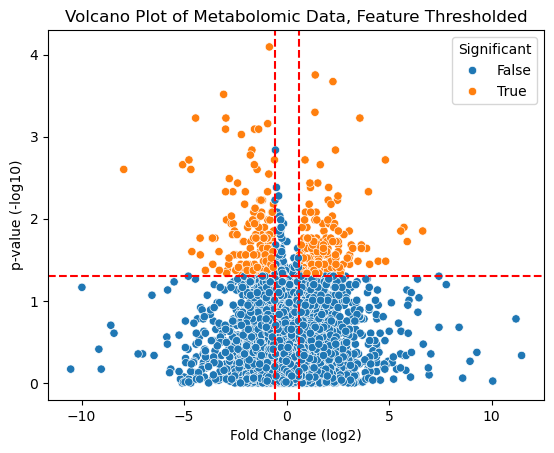

In [30]:
sns.scatterplot(data=volcano_df, x="Fold Change (log2)", y="p-value (-log10)", hue="Significant")
plt.axhline(y=-np.log10(0.05), color='r', linestyle='--')
plt.axvline(x=np.log2(1.5), color='r', linestyle='--')
plt.axvline(x=-1 * np.log2(1.5), color='r', linestyle='--')
plt.title("Volcano Plot of Metabolomic Data, Feature Thresholded")

In [4]:
vip_score_data_significant_indices = vip_score_data.index.isin(volcano_df[volcano_df["Significant"]].index)
vip_score_data_significant = vip_score_data[vip_score_data_significant_indices]

In [16]:
vip_score_data_significant

,VIP Score,row ID,compound name,compound score
6928,2.770030,28856,Biotin methyl ester CollisionEnergy:205060,0.860
1991,2.729876,15189,Suspect related to Sebacic acid (predicted mol...,0.800
4490,2.556983,31985,Spectral Match to Carboxyibuprofen from NIST14,0.877
4609,2.533140,30151,Suspect related to (.+/-.)7-epi-Jasmonic acid ...,0.705
4845,2.505832,1355,N_N_DIMETHYLARGININE,0.814
4696,2.295761,25918,Isofraxidin,0.786
1791,2.263678,37274,Spectral Match to Benzhydrol from NIST14,0.885
8361,2.209497,34144,Salcaprozic acid,0.810
1003,2.171814,8518,Candidate Glycine-C4:0 (delta mass:70.0419),0.731
22888,2.135622,25989,Suspect related to Stercobilin (predicted mole...,0.768


In [32]:
with PdfPages("../output_data/boxplots_vip_score_significant.pdf") as pdf:
    for i, index in enumerate(vip_score_data_significant.index):

        p_value = volcano_df.loc[index, "original_p_value"]
        fold_change = volcano_df.loc[index, "Fold Change (log2)"]
        vip_score = vip_score_data_significant.loc[index, "VIP Score"]
        name = vip_score_data_significant.loc[index, "compound name"]
        if len (name) > 50:
            name = name[:50]
        if len (name) > 30:
            name = name[:len(name)//2] + "\n" + name[len(name)//2:]    
        name = name + " (" + str(index) + ")"
        cancer_data = metabolomic_data_samples_with_cancer_rclr.loc[index, :].values
        control_data = metabolomic_data_samples_with_control_rclr.loc[index, :].values
        all_data = np.concatenate((cancer_data, control_data))
        groups = np.concatenate((["Cancer"] * len(cancer_data), ["Control"] * len(control_data)))
        all_data_df = pd.DataFrame({index: all_data, "Group": groups})

        
        colors={
            "Cancer": "#f00000",
            "Control": "#bdbdbd"
        }
        plt.figure(figsize=(4, 6))
        ax = sns.boxplot(data=all_data_df, x="Group", y=index, palette=colors, width=0.3)
        ax.set_ylabel("Peak Areas (RCLR transformed)")
        for patch in ax.patches:
            fc = patch.get_facecolor()
            patch.set_facecolor(mpl.colors.to_rgba(fc, 0.7))
        plt.suptitle(f"{name}")
        sns.stripplot(data=all_data_df, x="Group", y=index, palette=colors, alpha=0.5)
        plt.title(f"VIP Score: {vip_score:.5f}, \np-value: {p_value:.5f}, \nFold Change: {fold_change:.5f}")
        plt.tight_layout()
        pdf.savefig()
        plt.close()

/tmp/ipykernel_40246/1630494071.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=all_data_df, x="Group", y=index, palette=colors, width=0.3)
/tmp/ipykernel_40246/1630494071.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=all_data_df, x="Group", y=index, palette=colors, alpha=0.5)
/tmp/ipykernel_40246/1630494071.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=all_data_df, x="Group", y=index, palette=colors, width=0.3)
/tmp/ipykernel_40246/1630494071.py:31: FutureWarning: 

Passing `palette` without ass

In [47]:
vip_score_data_significant

,VIP Score,row ID,compound name,compound score
6928,2.770030,28856,Biotin methyl ester CollisionEnergy:205060,0.860
1991,2.729876,15189,Suspect related to Sebacic acid (predicted mol...,0.800
4490,2.556983,31985,Spectral Match to Carboxyibuprofen from NIST14,0.877
4609,2.533140,30151,Suspect related to (.+/-.)7-epi-Jasmonic acid ...,0.705
4845,2.505832,1355,N_N_DIMETHYLARGININE,0.814
4696,2.295761,25918,Isofraxidin,0.786
1791,2.263678,37274,Spectral Match to Benzhydrol from NIST14,0.885
8361,2.209497,34144,Salcaprozic acid,0.810
1003,2.171814,8518,Candidate Glycine-C4:0 (delta mass:70.0419),0.731
22888,2.135622,25989,Suspect related to Stercobilin (predicted mole...,0.768


In [38]:
volcano_df["Significant"] == True

1        False
2        False
8        False
9        False
10       False
         ...  
23305    False
23320    False
23321    False
23331    False
23339    False
Name: Significant, Length: 9817, dtype: bool

In [27]:
def plot_feature_boxplot(data_df, feature_col, group_col, title, colors=None, y_label="Peak area",
                         chemical=None):
    """Create boxplot for a feature of interest"""
    if colors is None:
        colors = {
            "Postmeno_without_estrogen": "#bdbdbd", 
            "Postmeno_with_estrogen": "#807dba", 
            "Premenopausal": "#E794C1"
        }
    
    if chemical is not None:
        plt.figure(figsize=(8, 6))
    else:
        plt.figure(figsize=(4, 6))    
    
    # Create boxplot
    ax = sns.boxplot(
        x=group_col, 
        y=feature_col, 
        data=data_df,
        palette=colors,
        width=0.3,
        
    )

    for patch in ax.patches:
        fc = patch.get_facecolor()
        patch.set_facecolor(mpl.colors.to_rgba(fc, 0.7))
    
    # Add individual points
    sns.stripplot(
        x=group_col, 
        y=feature_col, 
        data=data_df,
        palette=colors,
        size=5, 
        alpha=1, 
        jitter=True
    )
    
    # Add statistical test (Kruskal-Wallis)
    # Select feature column
    cancer_patients = data_df[data_df[group_col] == "Cancer"].index.to_list()
    control_patients = [cancer_patients_nearest_patient_dict[patient] for patient in cancer_patients]
    cancer_group = data_df.loc[cancer_patients, feature_col]
    control_group = data_df.loc[control_patients, feature_col]
    wilxcoxon_test = scipy.stats.wilcoxon(cancer_group, control_group)
    p_val = wilxcoxon_test.pvalue
    
    # Format p-value text
    if p_val < 0.001:
        p_text = "p < 0.001"
    elif p_val < 0.01:
        p_text = f"p = {p_val:.3f}"
    elif p_val < 0.05:
        p_text = f"p = {p_val:.3f}"
    else:
        p_text = f"p = {p_val:.3f} (ns)"
    
    # Add p-value to plot
    plt.text(
        0.5, 
        0.95, 
        p_text, 
        horizontalalignment='center',
        verticalalignment='center', 
        transform=ax.transAxes,
        fontsize=12,
        bbox=dict(facecolor='white', alpha=0.5)
    )
    if chemical is not None:
        img = Draw.MolToImage(Chem.MolFromSmiles(chemical), size=(300, 300), kekulize=True, wedgeBonds=True)
        imagebox = OffsetImage(img, zoom=0.6)
        ab=AnnotationBbox(imagebox, (1.5, 0.5), frameon=False, xycoords='axes fraction', boxcoords="axes fraction")
        ax.add_artist(ab)
    
    plt.title(title)
    plt.ylabel(y_label)
    plt.xlabel("")
    plt.tight_layout()
    
    return plt

In [42]:
cancer_metabolomic_data_samples_rclr_p

,UA084,NU101,LU047,UM108,YU053,UM081,UP179,WU087,UP174,UP106,...,UA043,LU137,YU238,WU116,EM058,YU092,YU242,YU081,YU093,YU077
1,0.003087,0.002958,0.005653,0.001699,0.010234,0.001574,0.000520,0.002275,0.002123,0.002605,...,0.001925,0.002985,0.001349,0.004503,0.007235,0.004566,0.002640,0.007822,0.001995,0.001934
2,0.000947,0.000586,0.000835,0.000062,0.001980,0.000102,0.000128,0.000614,0.000032,0.000148,...,0.001053,0.000766,0.000344,0.000159,0.000275,0.000479,0.000206,0.000895,0.001007,0.000357
8,0.000316,0.001241,0.000372,0.000146,0.000370,0.000402,0.000341,0.000089,0.000032,0.000127,...,0.000171,0.000667,0.000073,0.000072,0.000378,0.000303,0.000175,0.000337,0.000253,0.000340
9,0.007807,0.003718,0.007592,0.003244,0.010383,0.001867,0.001405,0.007149,0.009269,0.000176,...,0.004713,0.003375,0.002162,0.003993,0.003943,0.006101,0.000516,0.004158,0.001004,0.007330
10,0.025332,0.020628,0.000709,0.003721,0.001319,0.000137,0.000128,0.013025,0.055362,0.000438,...,0.002890,0.000492,0.000482,0.000072,0.000053,0.000208,0.000044,0.000034,0.000072,0.000063
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,0.008125,0.010205,0.002252,0.003643,0.008658,0.000925,0.000128,0.003992,0.009714,0.002500,...,0.000061,0.000055,0.005834,0.000418,0.001794,0.002588,0.003845,0.005556,0.000072,0.000063
23320,0.003042,0.001702,0.000049,0.000236,0.000068,0.000097,0.000128,0.000089,0.000032,0.000129,...,0.000061,0.000305,0.000073,0.000072,0.000053,0.000087,0.000044,0.000442,0.000436,0.000063
23321,0.003730,0.003131,0.001060,0.001178,0.000068,0.000671,0.000128,0.000089,0.000032,0.000034,...,0.000577,0.001757,0.000073,0.000329,0.000053,0.000367,0.000044,0.000034,0.000988,0.000063
23331,0.002737,0.001606,0.000049,0.001859,0.000068,0.000343,0.000128,0.000089,0.000291,0.000034,...,0.000147,0.000055,0.000073,0.000072,0.000053,0.000087,0.000044,0.003068,0.000072,0.000063


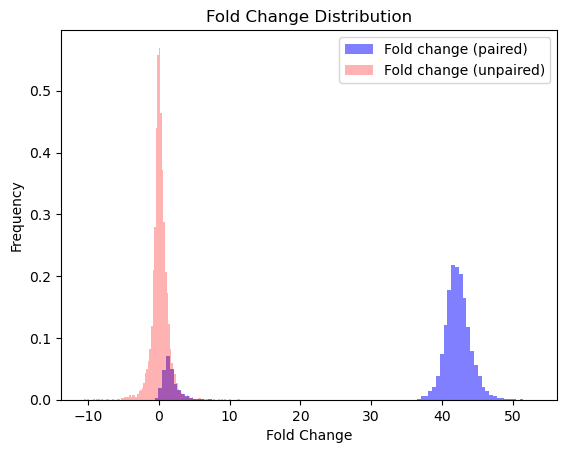

In [82]:
plt.hist(fold_change_paired, bins=100, alpha=0.5, color='blue', label='Fold change (paired)', density=True)
plt.hist(fold_change_unpaired, bins=100, alpha=0.3, color='red', label='Fold change (unpaired)', density=True)
plt.xlabel("Fold Change")
plt.ylabel("Frequency")
plt.title("Fold Change Distribution")
plt.legend()

In [14]:
metabolomic_data_samples_with_control

,UA084,NU101,UM108,YU053,UP106,UA007,WU008,UA044,WU251,WU231,...,UP034,UM228,LU060,WU091,UA043,LU137,YU092,YU242,YU093,YU077
1,94658.195,103648.380,37104.2270,111650.8700,82248.5500,55714.3300,11767.475,97815.570,50019.2000,27585.4510,...,25920.0040,56276.1170,73701.195,72013.4000,30429.0180,67018.440,55374.7580,49794.4920,28495.2070,23771.7420
2,29042.088,20517.969,0.0000,21599.4060,4656.3360,3212.1802,6616.331,100551.950,26243.3900,6889.6377,...,15706.0050,25535.5210,25643.582,4559.4575,16648.5980,17202.416,5810.9766,3877.3708,14382.3610,4387.6875
8,9682.641,43472.195,3189.5654,4040.5552,4005.1406,2205.0005,0.000,7124.198,2357.8232,0.0000,...,0.0000,5400.4170,6813.418,24600.6110,2710.9377,14977.412,3669.0757,3292.1840,3610.6167,4176.6387
9,239381.140,130290.410,70864.7900,113281.7400,5566.4014,262152.6600,13102.901,13385.961,85815.7800,10372.8370,...,46041.0160,129475.4840,89590.420,44217.0100,74506.5200,75766.980,73991.9700,9726.3220,14345.1390,90097.6500
10,776681.300,722830.300,81289.7400,14390.2090,13814.8520,564987.9000,0.000,0.000,3950.2988,60181.0740,...,5374.1910,0.0000,82394.516,0.0000,45688.5900,11041.545,2522.0718,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,249110.810,357586.060,79565.9800,94462.6400,78908.2900,108592.9300,0.000,56610.290,183515.9000,31552.2950,...,3541.6172,40381.5080,175820.270,36871.3000,0.0000,0.000,31384.9160,72515.2660,0.0000,0.0000
23320,93269.640,59634.047,5155.4727,0.0000,4084.3123,7651.1836,0.000,4402.713,3531.1824,0.0000,...,0.0000,3672.6353,19593.957,5235.8643,0.0000,6842.280,0.0000,0.0000,6233.5450,0.0000
23321,114359.880,109711.220,25734.5800,0.0000,0.0000,18682.4940,0.000,11104.808,5376.3680,0.0000,...,0.0000,5136.1396,25661.303,7436.4510,9125.1150,39448.580,4455.5723,0.0000,14109.0820,0.0000
23331,83903.190,56282.613,40605.1300,0.0000,0.0000,9172.3300,0.000,0.000,7997.9180,0.0000,...,0.0000,4093.3447,33535.750,2987.6052,2326.9092,0.000,0.0000,0.0000,0.0000,0.0000


In [10]:
cancer_metabolomic_data_samples_T

,1,2,8,9,10,12,15,16,17,22,...,23091,23153,23192,23202,23239,23305,23320,23321,23331,23339
UA084,94658.195,29042.0880,9682.6410,239381.1400,7.766813e+05,3163236.200,0.0000,2779.8267,3400.9697,8579.6340,...,16379.9360,327038.970,0.0000,0.0000,211288.4000,249110.8100,93269.6400,114359.8800,83903.1900,257800.560
NU101,103648.380,20517.9690,43472.1950,130290.4100,7.228303e+05,1473767.900,0.0000,0.0000,0.0000,26632.8750,...,0.0000,739803.400,78446.5100,0.0000,189110.7800,357586.0600,59634.0470,109711.2200,56282.6130,452625.030
LU047,130894.480,19334.2300,8617.1090,175799.2200,1.641541e+04,1455712.800,0.0000,6172.4463,3236.4116,8216.0940,...,160512.3000,260848.420,38866.2540,0.0000,7876.1377,52158.3160,0.0000,24555.0640,0.0000,63113.680
UM108,37104.227,0.0000,3189.5654,70864.7900,8.128974e+04,912418.800,0.0000,0.0000,5252.7980,5155.1650,...,0.0000,138849.110,18521.9400,11598.6620,109513.6700,79565.9800,5155.4727,25734.5800,40605.1300,88370.695
YU053,111650.870,21599.4060,4040.5552,113281.7400,1.439021e+04,689437.700,0.0000,0.0000,3255.1797,0.0000,...,0.0000,24977.543,4453.2627,0.0000,8774.3640,94462.6400,0.0000,0.0000,0.0000,110452.445
UM081,48610.223,3145.0488,12418.1050,57678.6900,4.241718e+03,528410.250,9346.5460,3993.2866,0.0000,31335.7420,...,32249.1970,175508.060,0.0000,0.0000,33005.7660,28583.8280,2982.0718,20725.6290,10584.7220,29518.705
UP179,4069.221,0.0000,2666.6184,10984.6850,0.000000e+00,155466.060,0.0000,0.0000,7611.9985,0.0000,...,0.0000,14222.937,0.0000,195594.3300,0.0000,0.0000,0.0000,0.0000,0.0000,0.000
WU087,31527.440,8513.3310,0.0000,99057.9900,1.804957e+05,615740.900,0.0000,0.0000,9223.3260,28500.4100,...,0.0000,35939.360,0.0000,5181.4766,0.0000,55311.0800,0.0000,0.0000,0.0000,48423.734
UP174,42293.550,0.0000,0.0000,184635.1600,1.102846e+06,1132327.200,10074.0410,0.0000,6676.8850,24105.9200,...,0.0000,72723.550,18229.1580,0.0000,92428.9140,193507.8100,0.0000,0.0000,5797.9067,231013.890
UP106,82248.550,4656.3360,4005.1406,5566.4014,1.381485e+04,596956.800,3995.5461,0.0000,3430.2043,57518.1370,...,0.0000,229785.200,0.0000,0.0000,24506.4960,78908.2900,4084.3123,0.0000,0.0000,111453.336
